# ML Image Compression

Denis Barilov, January 2026

---

To see the process of preparing the dataset and creating a model, please, open [the first part of the project](ImageCompression_part_1.ipynb).

---

## 3. Benchmarking

It is time to calculate metrics and examin the results.

In [10]:
%pip install lpips

In [11]:
from lpips import LPIPS
from torchmetrics.image import StructuralSimilarityIndexMeasure, MultiScaleStructuralSimilarityIndexMeasure, PeakSignalNoiseRatio
from torchmetrics.image.dists import DeepImageStructureAndTextureSimilarity
import torchvision.transforms.v2 as T
from io import BytesIO
from frozendict import frozendict
import copy
import time
from torchmetrics.functional.image import deep_image_structure_and_texture_similarity

*Make sure you also imported and executed everything neccessary from the previous section.*

### 3.1. Prepare the Model

In case we want to compare our model with existing instruments, we have to make main model customizable.

I will also change the behaviour of padding. It was bit obligatory in the previous sections, but now it would be nice to fix one-pixel frame around photo - you do not need it in your images.

Tenet - **T**onal Auto **E**ncoding Convolutional Neural **Net**work.

In [26]:
class Tenet(nn.Module):
    def __init__(self, embedded_channels = 128, tone_layers = 3):
        super(Tenet, self).__init__()

        if tone_layers <= 2:
            self.skip_encoder = nn.Sequential(
                *[nn.AvgPool2d(kernel_size=2, stride=2) for _ in range(tone_layers-2)]
            )  # -> 3 x 400^{-tone_layers} x 320^{-tone_layers}
        else:
            self.skip_encoder = nn.Sequential(
                nn.AvgPool2d(kernel_size=2, stride=2),
                nn.AvgPool2d(kernel_size=2, stride=2),
                *[TonePool2d() for _ in range(tone_layers-2)]
            )  # -> 3 x 400^{-tone_layers} x 320^{-tone_layers}


        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1, padding_mode='reflect'),  # -> 16 x 200 x 160
            nn.BatchNorm2d(16),
            nn.ReLU(),

            BasicBlock(inplanes=16, planes=16),

            nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1, padding_mode='reflect'),  # -> 32 x 100 x 80
            nn.BatchNorm2d(32),
            nn.ReLU(),

            BasicBlock(inplanes=32, planes=32),

            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1, padding_mode='reflect'),  # -> 64 x 50 x 40
            nn.BatchNorm2d(64),
            nn.ReLU(),

            BasicBlock(inplanes=64, planes=64),

            nn.Conv2d(64, embedded_channels, kernel_size=3, stride=2, padding=1, padding_mode='reflect'),  # -> embedded_channels x 25 x 20
            nn.BatchNorm2d(embedded_channels),
            nn.ReLU(),

            BasicBlock(inplanes=embedded_channels, planes=embedded_channels),
        )

        self.skip_decoder = nn.Sequential(
            nn.Upsample(scale_factor=2**tone_layers, mode='bicubic'),  # -> 3 x 400 x 320
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(embedded_channels, 64, kernel_size=3, stride=2, padding=1, output_padding=1),  # -> 64 x 50 x 40
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),  # -> 32 x 100 x 80
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.ConvTranspose2d(32, 16, kernel_size=3, stride=2, padding=1, output_padding=1),  # -> 16 x 200 x 160
            nn.BatchNorm2d(16),
            nn.ReLU(),

            nn.ConvTranspose2d(16, 8, kernel_size=3, stride=2, padding=1, output_padding=1),  # -> 8 x 400 x 320
            nn.Sigmoid()
        )

        self.combiner = nn.Sequential(  # (8+3) x 400 x 320
            nn.Conv2d(11, 3, kernel_size=5, stride=1, padding=2, padding_mode='reflect'),  # -> 3 x 400 x 320
            nn.Sigmoid()
        )

    def forward(self, x):
        skipped = self.skip_encoder(x)
        encoded = self.encoder(x)

        upsampled = self.skip_decoder(skipped)
        decoded = self.decoder(encoded)
        combined = torch.cat([decoded, upsampled], dim=1)

        return self.combiner(combined)

    def compress(self, x):
        skipped = self.skip_encoder(x)
        encoded = self.encoder(x)
        return (skipped, encoded)

    def decompress(self, embedding):
        skipped, encoded = embedding

        upsampled = self.skip_decoder(skipped)
        decoded = self.decoder(encoded)
        combined = torch.cat([decoded, upsampled], dim=1)

        return self.combiner(combined)


In [ ]:
model = Tenet().to(device)
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
criterion = get_combined_loss(0.5)

experiment = train(model, optimizer, criterion, model_name="Tenet-128-3_MSSSIM_05", early_stop_params=[1e-6, 20, 0.9], noize_intensity=0, hyperparameters={"lr": lr, "weight_decay": weight_decay, "loss": "combined", "alpha": 0.5}, model_hyperparameters={"embedded_channels": 128, "tone_layers": 3})

experiments[experiment['model_name']] = experiment
save_experiment(experiment)

  0%|          | 0/150 [00:00<?, ?it/s]

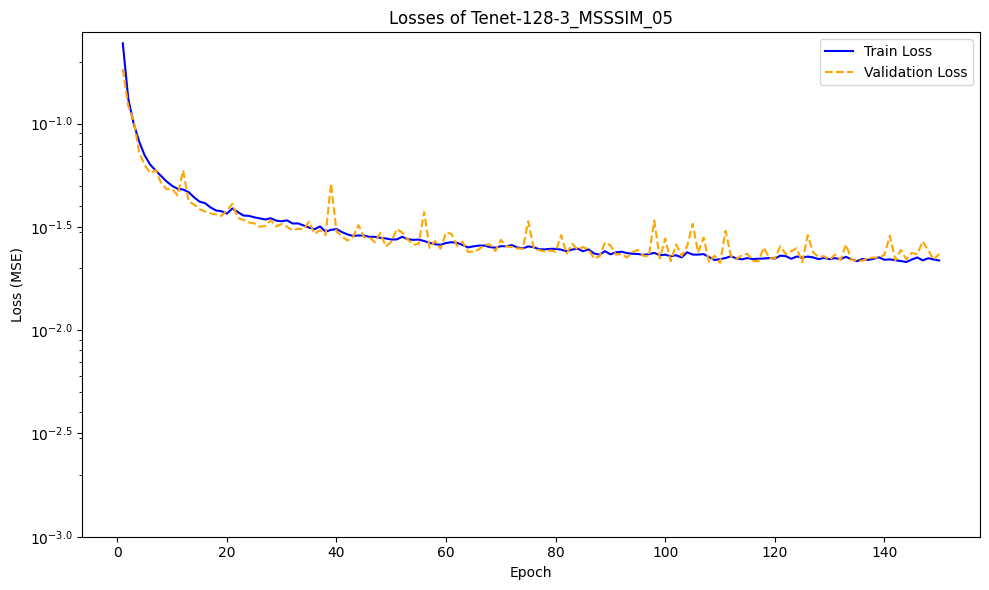

In [ ]:
draw_loss(experiment, ticks=np.logspace(-3, -1, 5))

In [ ]:
model = ToneResCNNAutoencoder().to(device)
load_model(experiments, model, 'ToneResCNNAutoencoder_MSSSIM_05', '/kaggle/input/tonerescnnautoencoder-msssim-05/pytorch/default/1/ToneResCNNAutoencoder_MSSSIM_05.pth')

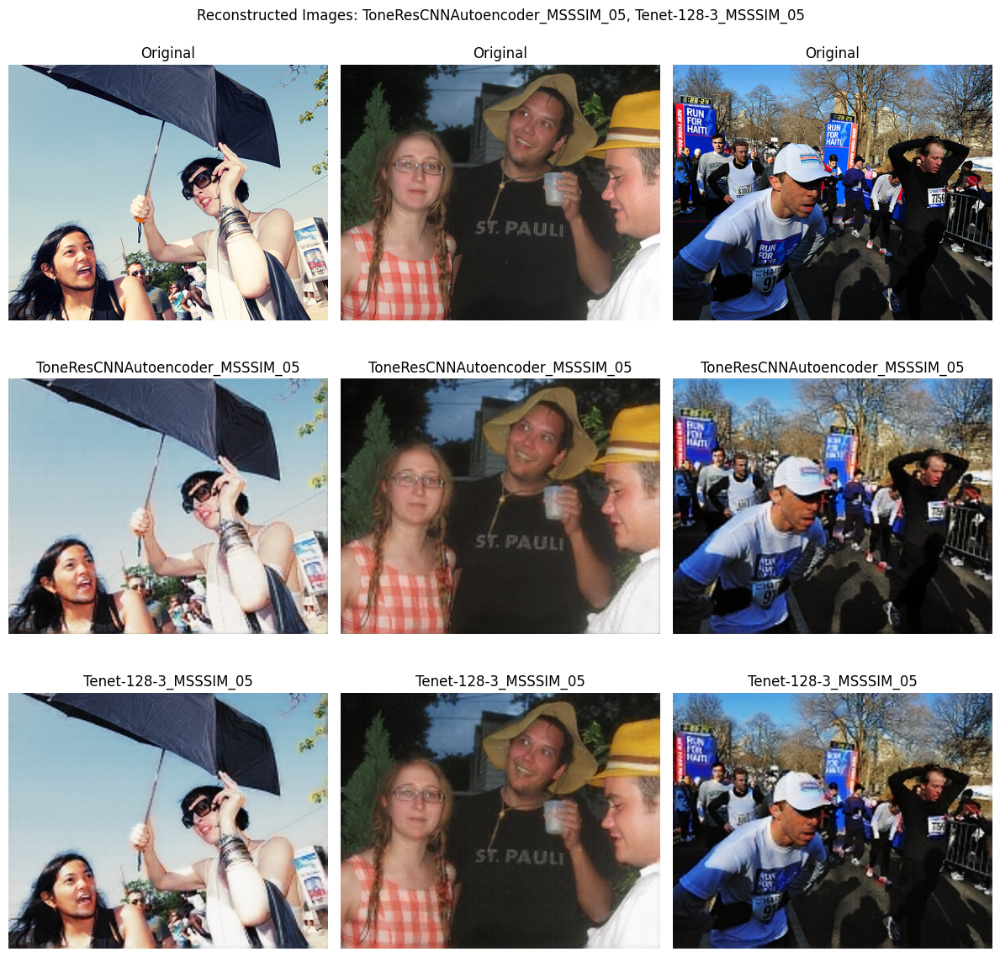

In [ ]:
compare_images([None, experiments["ToneResCNNAutoencoder_MSSSIM_05"], experiments["Tenet-128-3_MSSSIM_05"]], val_loader)

Very slight enhancement, but alright - we are done with engineering. Move on.

We can try to compress about two times more agressive.

In [ ]:
((128 * 25 * 20 + 3 * 50 * 40) / 2 - 3 * 50 * 40) / 25 / 20

58.0

In [ ]:
model = Tenet(embedded_channels=58, tone_layers=3).to(device)
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
criterion = get_combined_loss(0.5)

experiment = train(model, optimizer, criterion, model_name="Tenet-58-3_MSSSIM_05", early_stop_params=[1e-6, 20, 0.9], noize_intensity=0, hyperparameters={"lr": lr, "weight_decay": weight_decay, "loss": "combined", "alpha": 0.5}, model_hyperparameters={"embedded_channels": 58, "tone_layers": 3})

experiments[experiment['model_name']] = experiment
save_experiment(experiment)

  0%|          | 0/150 [00:00<?, ?it/s]

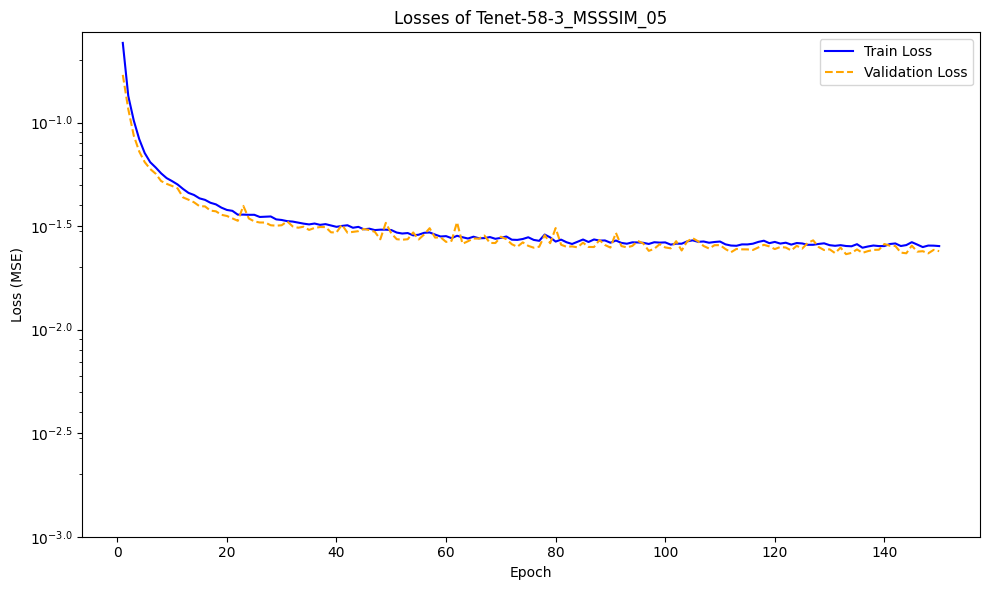

In [ ]:
draw_loss(experiment, ticks=np.logspace(-3, -1, 5))

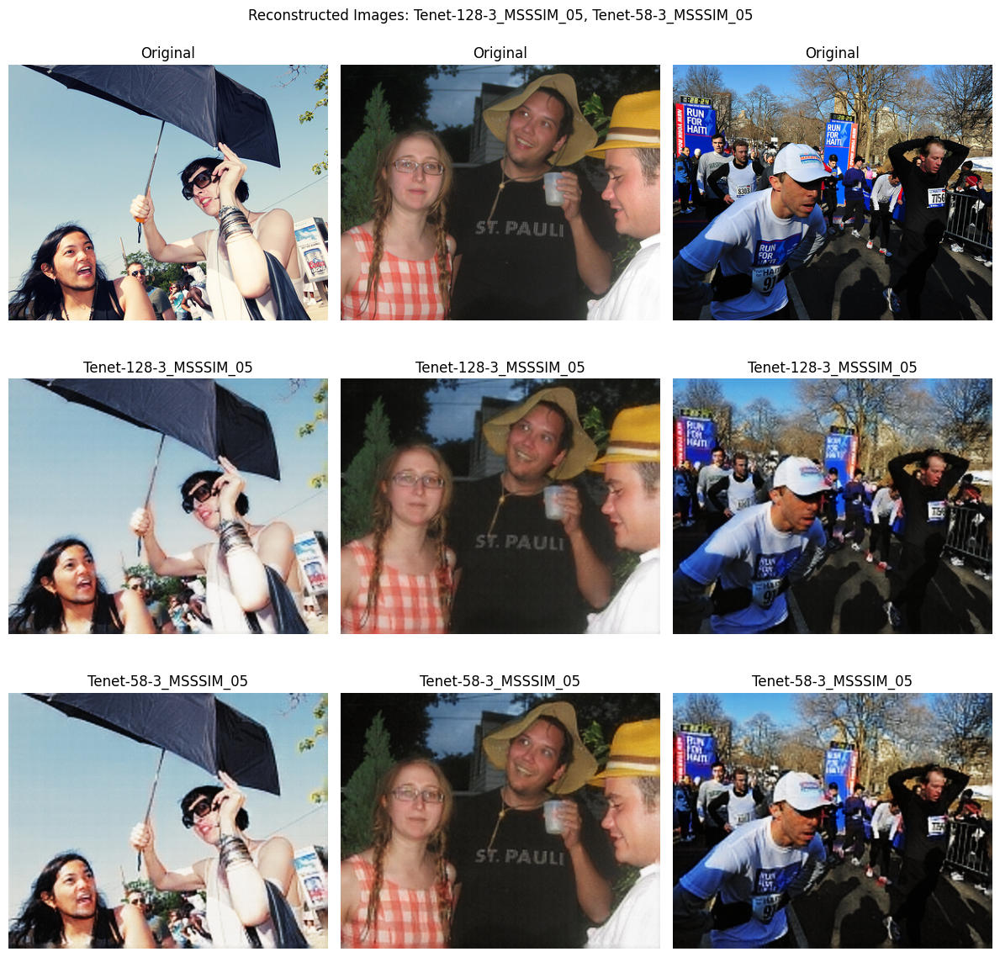

In [ ]:
compare_images([None, experiments["Tenet-128-3_MSSSIM_05"], experiments["Tenet-58-3_MSSSIM_05"]], val_loader)

Oh... That is almost identical result. We cut the embedding size and still have untouched quality.

Some cells ago I have calculated the amount of parameters. So, here are the functions to bypass this calculations in future.

In [ ]:
def parameters_by_channels(channels, tone_layers = 3):
    tone_parameters = 3 * 400 * 320 / 4 ** tone_layers
    return channels * 25 * 20 + tone_parameters

def channels_by_parameters(parameters, tone_layers = 3):
    tone_parameters = 3 * 400 * 320 / 4 ** tone_layers
    remaining = parameters - tone_parameters
    channels = remaining // (25 * 20)
    if channels < 1:
        raise ValueError(f"Too few parameters. Should be at least {parameters_by_channels(1, tone_layers)}.")
    return channels

def channels_by_bytes(b, tone_layers = 3):
    return channels_by_parameters(b // 4, tone_layers)

In [ ]:
parameters_default = parameters_by_channels(128)
parameters_default

70000.0

In [ ]:
channels_by_parameters(parameters_default // 2, 3)

58.0

In [ ]:
channels_by_parameters(parameters_default // 4, 4)

32.0

In [ ]:
model = Tenet(embedded_channels=32, tone_layers=4).to(device)
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
criterion = get_combined_loss(0.5)

experiment = train(model, optimizer, criterion, model_name="Tenet-32-4_MSSSIM_05", early_stop_params=[1e-6, 20, 0.9], noize_intensity=0, hyperparameters={"lr": lr, "weight_decay": weight_decay, "loss": "combined", "alpha": 0.5}, model_hyperparameters={"embedded_channels": 32, "tone_layers": 4})

experiments[experiment['model_name']] = experiment
save_experiment(experiment)

  0%|          | 0/150 [00:00<?, ?it/s]

In [ ]:
channels_by_parameters(parameters_default // 8, 4)

14.0

In [ ]:
model = Tenet(embedded_channels=14, tone_layers=4).to(device)
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
criterion = get_combined_loss(0.5)

experiment = train(model, optimizer, criterion, model_name="Tenet-14-4_MSSSIM_05", early_stop_params=[1e-6, 20, 0.9], noize_intensity=0, hyperparameters={"lr": lr, "weight_decay": weight_decay, "loss": "combined", "alpha": 0.5}, model_hyperparameters={"embedded_channels": 14, "tone_layers": 4})

experiments[experiment['model_name']] = experiment
save_experiment(experiment)

  0%|          | 0/150 [00:00<?, ?it/s]

In [30]:
model = Tenet(embedded_channels=128, tone_layers=3).to(device)
load_model(experiments, model, 'Tenet-128-3_MSSSIM_05', force=True)

In [31]:
model = Tenet(embedded_channels=58, tone_layers=3).to(device)
load_model(experiments, model, 'Tenet-58-3_MSSSIM_05', force=True)

In [32]:
model = Tenet(embedded_channels=32, tone_layers=4).to(device)
load_model(experiments, model, 'Tenet-32-4_MSSSIM_05', force=True)

In [33]:
model = Tenet(embedded_channels=14, tone_layers=4).to(device)
load_model(experiments, model, 'Tenet-14-4_MSSSIM_05', force=True)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


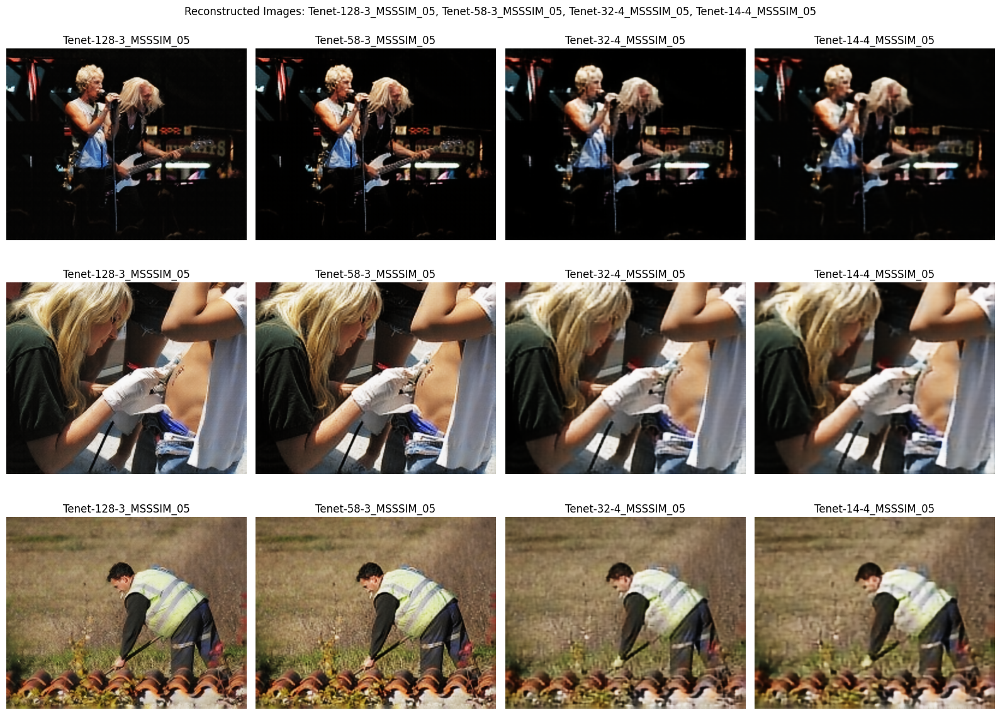

In [39]:
compare_images([experiments["Tenet-128-3_MSSSIM_05"], experiments["Tenet-58-3_MSSSIM_05"], experiments["Tenet-32-4_MSSSIM_05"], experiments["Tenet-14-4_MSSSIM_05"]], val_loader)

### 3.2 Choose Formats

First, I have to understand to main rivals. The most popular formats to store images nowadays are `JPEG`, `WebP` and `PNG`. And also in the articals on these theme authors compare their models with `JPEG2000`.

In [12]:
FORMATS = {
    'WEBP': {
        'format_name': 'WebP',
        'format': 'WEBP',
        'extension': '.webp',
        'params': [
            {'lossless': True, 'method': 6},
            {'quality': 82, 'method': 6},
            {'quality': 75, 'method': 6},
            {'quality': 60, 'method': 4},
        ]
    },
    'JPEG': {
        'format_name': 'JPEG',
        'format':'JPEG' ,
        'extension': '.jpg',
        'params': [
            {'quality': 85, 'optimize': True, 'progressive': True},
            {'quality': 75},
            {'quality': 90, 'optimize': True},
            {'quality': 60},
        ]
    },
    'JPEG2000': {
        'format_name': 'JPEG 2000',
        'format': 'JPEG2000',
        'extension': '.jp2',
        'params': [
            {'irreversible': True, 'quality_layers': [0.8]},
            {'irreversible': True, 'quality_layers': [0.5, 0.3]},
            {'irreversible': False},
        ]
    },
    'PNG': {
        'format_name': 'PNG',
        'format': 'PNG',
        'extension': '.png',
        'params': [
            {'compress_level': 3},
            {'compress_level': 9},
            {'compress_level': 6},
        ]
    }
}

In [16]:
mse_function = nn.MSELoss(reduction='none').to(device)
mse_metric_tensor = lambda x, y: mse_function(x, y).mean(dim=[1,2,3])

def psnr_metric_tensor(x, y):
    mse = mse_metric_tensor(x, y)
    psnr = 10 * torch.log10(1 / (mse + 1e-8))
    return psnr

ssim_metric_tensor = StructuralSimilarityIndexMeasure(data_range=1.0, reduction="none").to(device)

ms_ssim_metric_tensor = MultiScaleStructuralSimilarityIndexMeasure(data_range=1.0, reduction="none").to(device)

# dists_function = DeepImageStructureAndTextureSimilarity().to(device)
dists_metric_tensor = lambda x, y: deep_image_structure_and_texture_similarity(x, y, reduction='none')

lpips_metric_tensor = LPIPS(net='alex').to(device)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth


### 3.3 Choose Metrics

Chosen metrics are either used in the famous articles on these theme or correlates with human's eye perspective.

In [17]:
METRICS = {
    'MSE': {
        'function': mse_metric_tensor,
        'name': 'MSE',
        'full_name': 'Mean Squared Error',
        'direction': -1,
    },
    'PSNR': {
        'function': psnr_metric_tensor,
        'name': 'PSNR',
        'full_name': 'Peak Signal-to-Noise Ratio',
        'direction': 1,
    },
    'SSIM': {
        'function': ssim_metric_tensor,
        'name': 'SSIM',
        'full_name': 'Structural Similarity Index',
        'direction': 1,
    },
    'MS-SSIM': {
        'function': ms_ssim_metric_tensor,
        'name': 'MS-SSIM',
        'full_name': 'Multi-Scale Structural Similarity',
        'direction': 1,
    },
    # 'DISTS': {
    #     'function': dists_metric_tensor,
    #     'name': 'DISTS',
    #     'full_name': 'Deep Image Structure and Texture Similarity',
    #     'direction': 1,
    # },
    'LPIPS': {
        'function': lpips_metric_tensor,
        'name': 'LPIPS',
        'full_name': 'Learned Perceptual Image Patch Similarity',
        'direction': 1,
    },
}


### 3.4 Calculate the Metrics

In [18]:
def tensor_to_pil(tensor):
    return T.ToPILImage()(tensor)

def compress_image_pil(image, fmt, params):
    buffer = BytesIO()
    image.save(buffer, format=fmt['format'], **params)
    buffer.seek(0)
    return buffer

def bytes_to_image_pil(buffer):
    compressed = Image.open(buffer)
    return compressed

def image_pil_to_tensor(image):
    converted = image.convert('RGB')
    return T.ToTensor()(converted)

In [19]:
def check_tensor(tensor):
    if not list(tensor.shape) == [3, 320, 400]:
        raise ValueError('Incorrect tensor.')
    if not (tensor.min() >= 0.0 and tensor.max() <= 1.0):
        raise ValueError('Incorrect tensor.')

for fmt in tqdm(FORMATS.values()):
    images = next(iter(val_loader))
    tensor_in = next(iter(images))
    tensor_out = image_pil_to_tensor(bytes_to_image_pil(compress_image_pil(tensor_to_pil(tensor_in), fmt, fmt['params'][0])))
    check_tensor(tensor_in)
    check_tensor(tensor_out)

  0%|          | 0/4 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


In [19]:
results_formats = dict()

In [ ]:
# for fmt, params in tqdm([(fmt, params) for fmt in FORMATS.values() for params in fmt['params']]):
for fmt, params in [(fmt, params) for fmt in FORMATS.values() for params in fmt['params']]:
    key = f"{fmt['format']} {str(params)}"
    print(key)

    value = copy.deepcopy(fmt)
    value['params'] = params

    times_compress = []
    times_decompress = []
    sizes = []
    metrics = dict()

    for name, metric in METRICS.items():
        metric_storable = copy.deepcopy(metric)
        del metric_storable['function']

        metrics[name] = metric_storable
        metric_storable['results'] = list()

    for images in test_loader:
        decompressed = []
        for image in images:
            image_pil = tensor_to_pil(image)

            start = time.perf_counter()
            buffer = compress_image_pil(image_pil, fmt, params)
            end = time.perf_counter()
            times_compress.append(end - start)

            sizes.append(len(buffer.getvalue()))

            start = time.perf_counter()
            image_compressed = bytes_to_image_pil(buffer)
            end = time.perf_counter()
            times_decompress.append(end - start)

            tensor = image_pil_to_tensor(image_compressed)
            decompressed.append(tensor)

        batch = torch.stack(decompressed)

        for name, metric in METRICS.items():
            print(name)
            metric_storable = metrics[name]
            # try:
            metric_storable['results'].extend(metric['function'](batch.to(images.device), images).tolist())
            # except Exception as e:
                # print(name)
                # raise e

    results_formats[key] = {
        'format': value,
        'times_compress': times_compress,
        'times_decompress': times_decompress,
        'sizes': sizes,
        'metrics': metrics,
    }


In [22]:
def save_results_formats():
    with open(f"{data_prefix}/results_formats.json", "w", encoding="utf-8") as f:
        json.dump(results_formats, f)

In [23]:
save_results_formats()

In [35]:
results_models = dict()

In [46]:
for model_name, experiment in tqdm(experiments.items()):
    print(model_name)
    times_compress = []
    times_decompress = []
    sizes = []
    metrics = dict()

    for name, metric in METRICS.items():
        metric_storable = copy.deepcopy(metric)
        del metric_storable['function']

        metrics[name] = metric_storable
        metric_storable['results'] = list()

    model = experiment['model']
    model.eval()
    with torch.no_grad():
        for images in test_loader:
            image = next(iter(images))

            start = time.perf_counter()
            compressed_1, compressed_2 = model.compress(image.unsqueeze(0))
            end = time.perf_counter()
            times_compress.extend([end - start] * images.shape[0])

            sizes.append((compressed_1.numel() + compressed_2.numel()) * 4)

            start = time.perf_counter()
            tensor = model.decompress((compressed_1, compressed_2))
            end = time.perf_counter()
            times_decompress.extend([end - start] * images.shape[0])

            decompressed = model(images)

            for name, metric in METRICS.items():
                metric_storable = metrics[name]
                metric_storable['results'].extend(metric['function'](decompressed.to(images.device), images).tolist())

    results_models[model_name] = {
        'model_name': model_name,
        'times_compress': times_compress,
        'times_decompress': times_decompress,
        'sizes': sizes,
        'metrics': metrics,
    }

  0%|          | 0/4 [00:00<?, ?it/s]

Tenet-128-3_MSSSIM_05


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Tenet-58-3_MSSSIM_05
Tenet-32-4_MSSSIM_05
Tenet-14-4_MSSSIM_05


In [40]:
def save_results_models():
    with open(f"{data_prefix}/results_models.json", "w", encoding="utf-8") as f:
        json.dump(results_models, f)

In [53]:
save_results_models()

In [51]:
def plot_benchmarks(results_formats, results_models):
    format_names = list(results_formats.keys())
    model_names = list(results_models.keys())

    fmt_compress = [np.mean(results_formats[name]['times_compress']) for name in format_names]
    fmt_decompress = [np.mean(results_formats[name]['times_decompress']) for name in format_names]
    fmt_sizes = [np.mean(results_formats[name]['sizes']) for name in format_names]

    mdl_compress = [np.mean(results_models[name]['times_compress']) for name in model_names]
    mdl_decompress = [np.mean(results_models[name]['times_decompress']) for name in model_names]
    mdl_sizes = [np.mean(results_models[name]['sizes']) for name in model_names]

    all_names = format_names + model_names
    all_compress = fmt_compress + mdl_compress
    all_decompress = fmt_decompress + mdl_decompress
    all_sizes = fmt_sizes + mdl_sizes

    x = np.arange(len(all_names))
    colors = ['blue'] * len(format_names) + ['orange'] * len(model_names)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

    ax1.bar(x, all_compress, color=colors, alpha=0.85)
    ax1.set_title('Compression Time (mean)', fontsize=13, pad=10)
    ax1.set_ylabel('Time, sec')
    ax1.grid(axis='y', alpha=0.3, linestyle='--')

    ax2.bar(x, all_decompress, color=colors, alpha=0.85)
    ax2.set_title('Decompression Time (mean)', fontsize=13, pad=10)
    ax2.set_ylabel('Time, sec')
    ax2.grid(axis='y', alpha=0.3, linestyle='--')

    ax3.bar(x, all_sizes, color=colors, alpha=0.85)
    ax3.set_title('File Size (mean)', fontsize=13, pad=10)
    ax3.set_ylabel('Size, bytes')
    ax3.grid(axis='y', alpha=0.3, linestyle='--')

    plt.xticks(x, all_names, rotation=45, ha='right', fontsize=9)

    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='blue', label='Formats'),
        Patch(facecolor='orange', label='Models')
    ]
    fig.legend(handles=legend_elements, loc='upper center', ncol=2, bbox_to_anchor=(0.5, 0.98), fontsize=11)

    plt.suptitle('Formats vs Models: Time and Size', fontsize=16, y=1.02)
    plt.tight_layout(rect=[0, 0, 1, 0.96])

    plt.show()

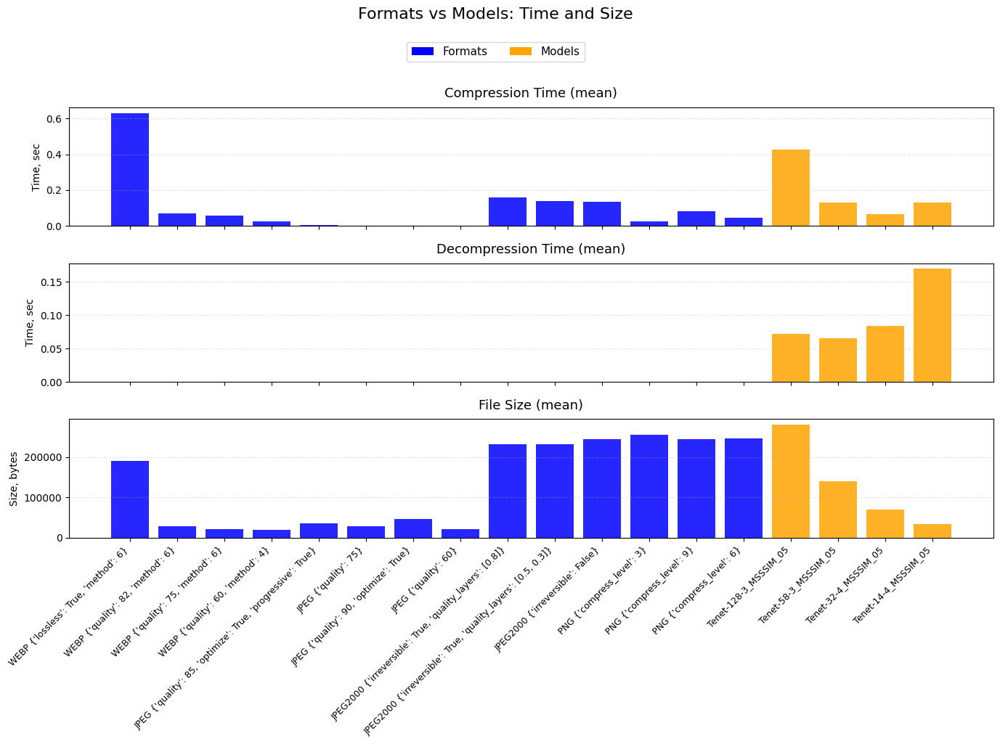

In [52]:
plot_benchmarks(results_formats, results_models)

In [54]:
def plot_metric(results_formats, results_models, metric_name, zero=False, log=False):
    format_names, format_sizes, format_metrics = [], [], []
    for name, data in results_formats.items():
        format_names.append(name)
        format_sizes.append(np.mean(data['sizes']))
        format_metrics.append(np.mean(data['metrics'][metric_name]['results']))

    model_names, model_sizes, model_metrics = [], [], []
    for name, data in results_models.items():
        model_names.append(name)
        model_sizes.append(np.mean(data['sizes']))
        model_metrics.append(np.mean(data['metrics'][metric_name]['results']))

    full_name = next(iter(results_models.values()))['metrics'][metric_name]['full_name']

    fig, ax = plt.subplots(figsize=(10, 8))

    ax.scatter(format_sizes, format_metrics, c='blue', s=100, alpha=0.8, label='Formats', zorder=3)

    ax.scatter(model_sizes, model_metrics, c='orange', s=100, alpha=0.8, label='Models', zorder=3)

    for i, name in enumerate(format_names):
        ax.annotate(name, (format_sizes[i], format_metrics[i]), xytext=(5, 5), textcoords='offset points', fontsize=8)
    for i, name in enumerate(model_names):
        ax.annotate(name, (model_sizes[i], model_metrics[i]), xytext=(5, 5), textcoords='offset points', fontsize=8)

    ax.set_xlabel('Average Size (bytes)')
    ax.set_ylabel(f'Average {metric_name}')

    if log:
        ax.set_yscale('log')

    if zero:
        ax.set_xlim(left=0)
        ax.set_ylim(bottom=0)

    ax.xaxis.set_major_locator(plt.MaxNLocator(8))
    ax.yaxis.set_major_locator(plt.MaxNLocator(8))

    ax.grid(True, alpha=0.3)
    ax.legend()
    ax.set_title(f'Size vs {full_name}')

    plt.tight_layout()
    plt.show()


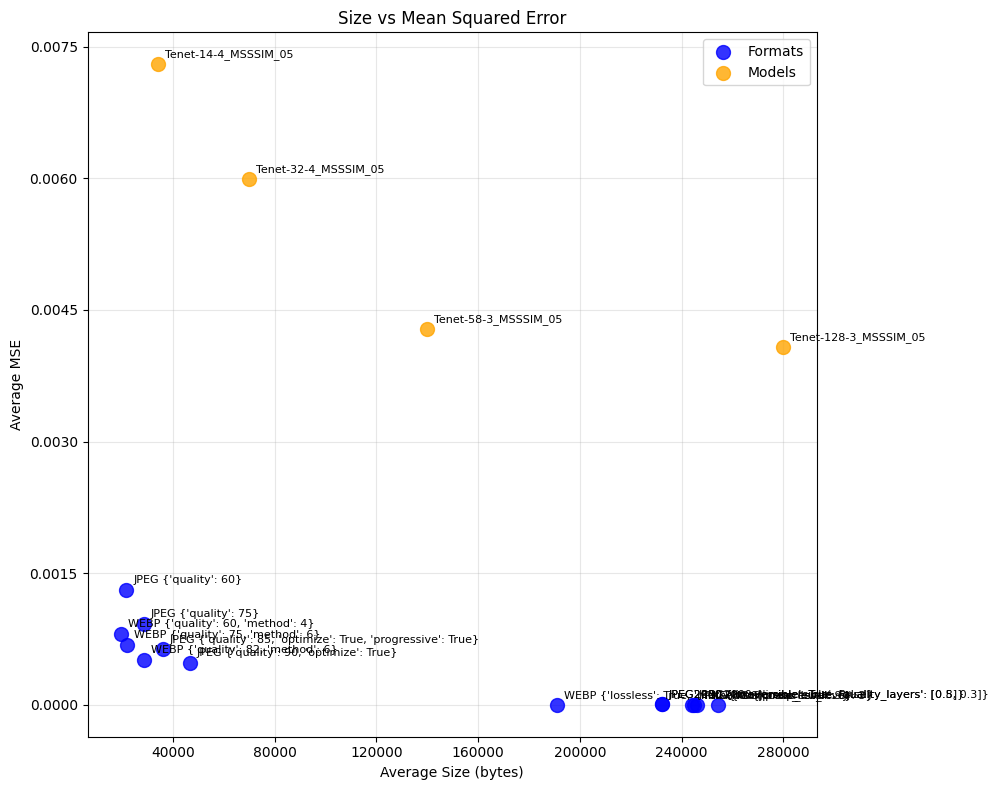

In [97]:
plot_metric(results_formats, results_models, 'MSE')

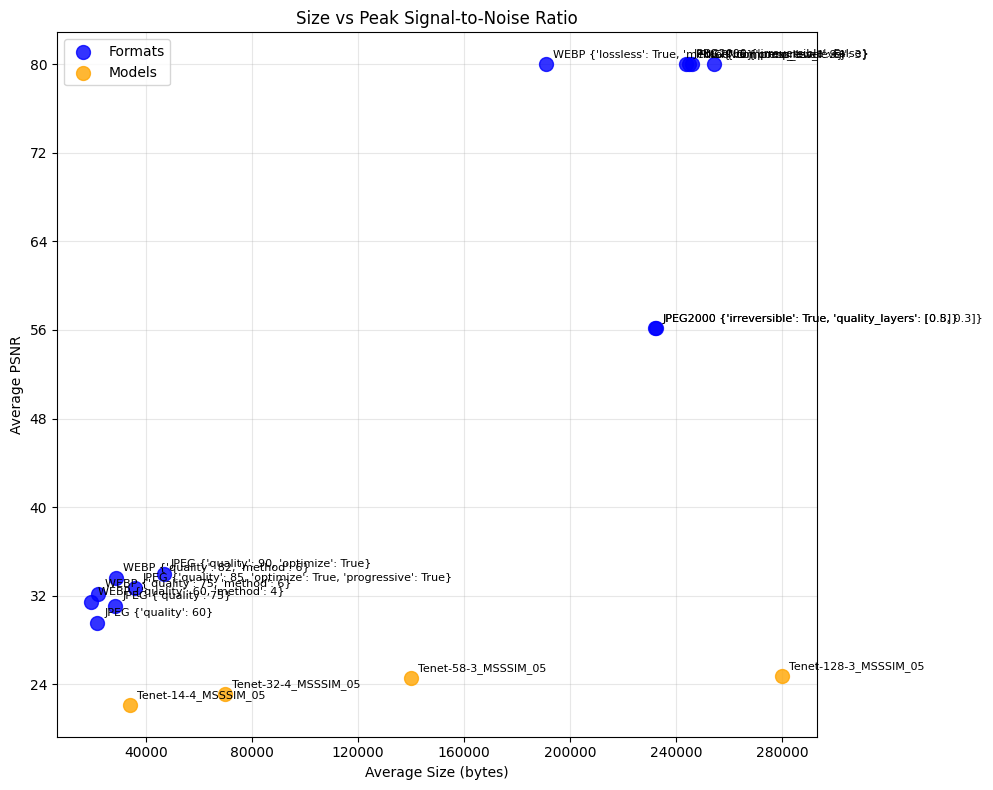

In [96]:
plot_metric(results_formats, results_models, 'PSNR')

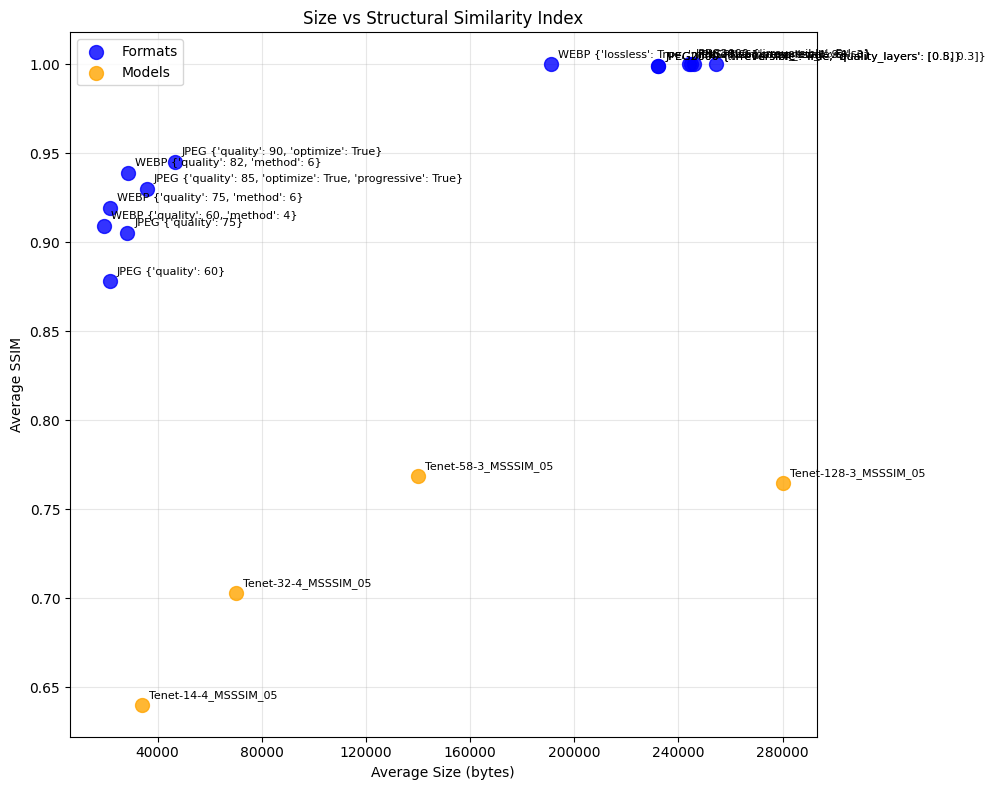

In [95]:
plot_metric(results_formats, results_models, 'SSIM')

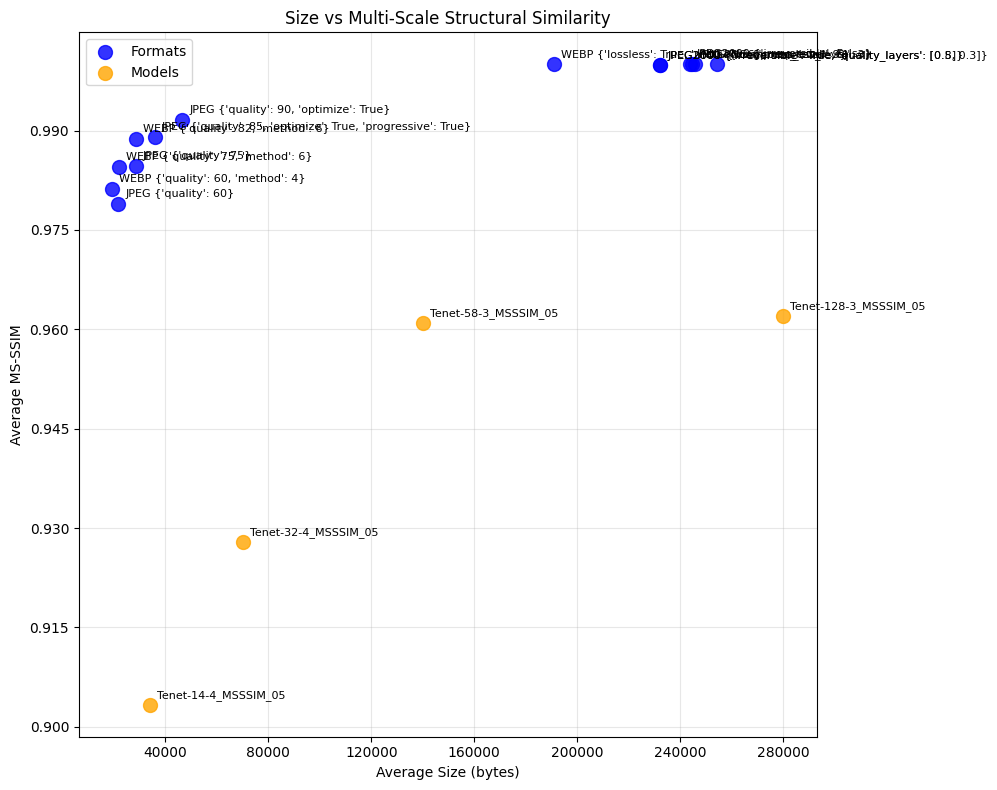

In [58]:
plot_metric(results_formats, results_models, 'MS-SSIM')

In [ ]:
# plot_metric(results_formats, results_models, 'DISTS')

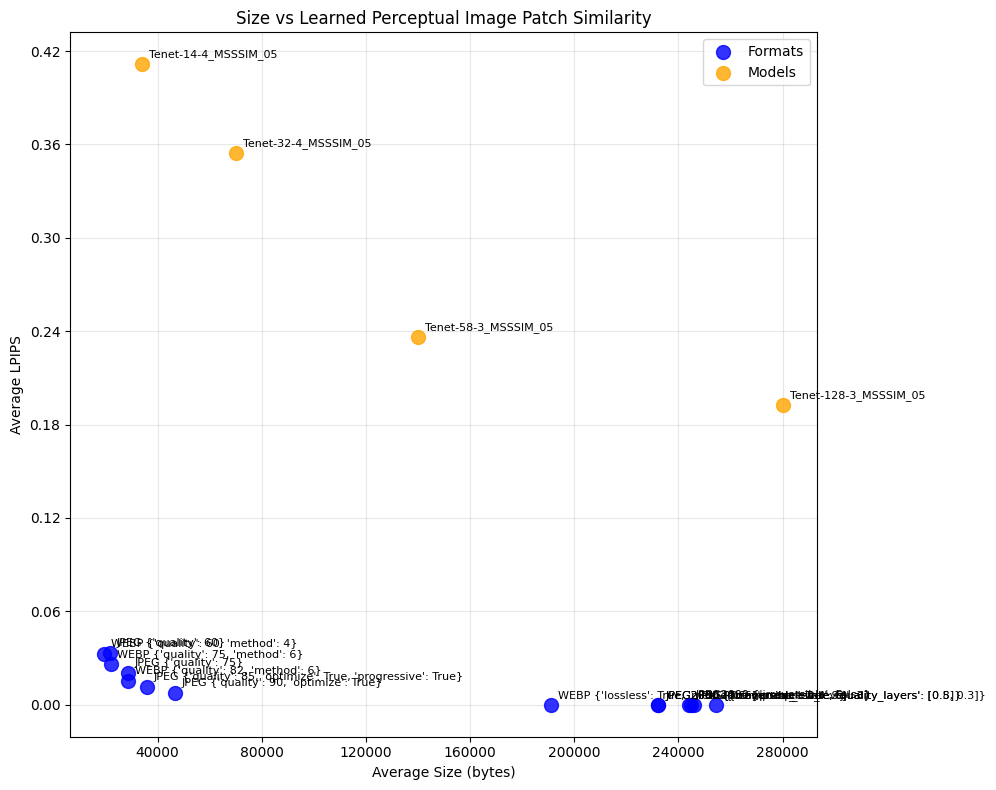

In [59]:
plot_metric(results_formats, results_models, 'LPIPS')

Unfortunately, our models did not beat any format. And at the first glance it seems like model are a lot worse than formats.

In [85]:
def formats_vs_models(tensor, positions = range(18), layout = (3, 6), figsize = (15, 8)):
    image_pil = tensor_to_pil(tensor)

    format_images = []
    format_names = []

    for fmt, params in [(fmt, params) for fmt in FORMATS.values() for params in fmt['params']]:
        key = f"{fmt['format']} {str(list(params.values()))}"
        buffer = compress_image_pil(image_pil, fmt, params)
        output = bytes_to_image_pil(buffer)

        format_images.append(output)
        format_names.append(key)

    model_images = []
    model_names = []

    for model_name, experiment in experiments.items():
        output_tensor = experiment['model'](tensor.unsqueeze(0))[0]
        output = tensor_to_pil(output_tensor)

        model_images.append(output)
        model_names.append(model_name)

    all_images = format_images + model_images
    all_names = format_names + model_names

    fig, axes = plt.subplots(*layout, figsize=figsize, dpi=100)
    axes = axes.ravel()

    for i, position in enumerate(positions):
        ax = axes[i]
        ax.imshow(all_images[position])
        ax.set_title(all_names[position])
        ax.axis('off')

    plt.suptitle("Formats vs Models: Images", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

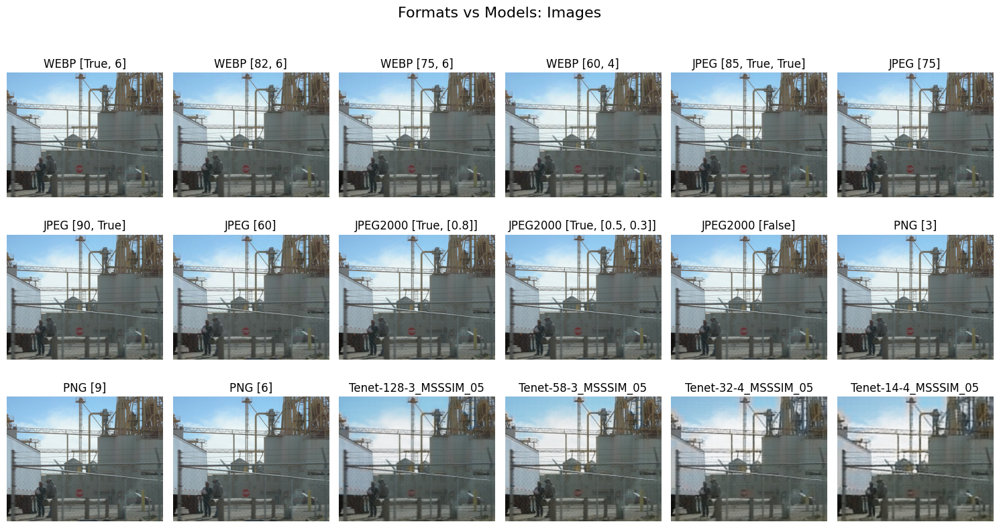

In [86]:
images = next(iter(test_loader))
formats_vs_models(images[7])

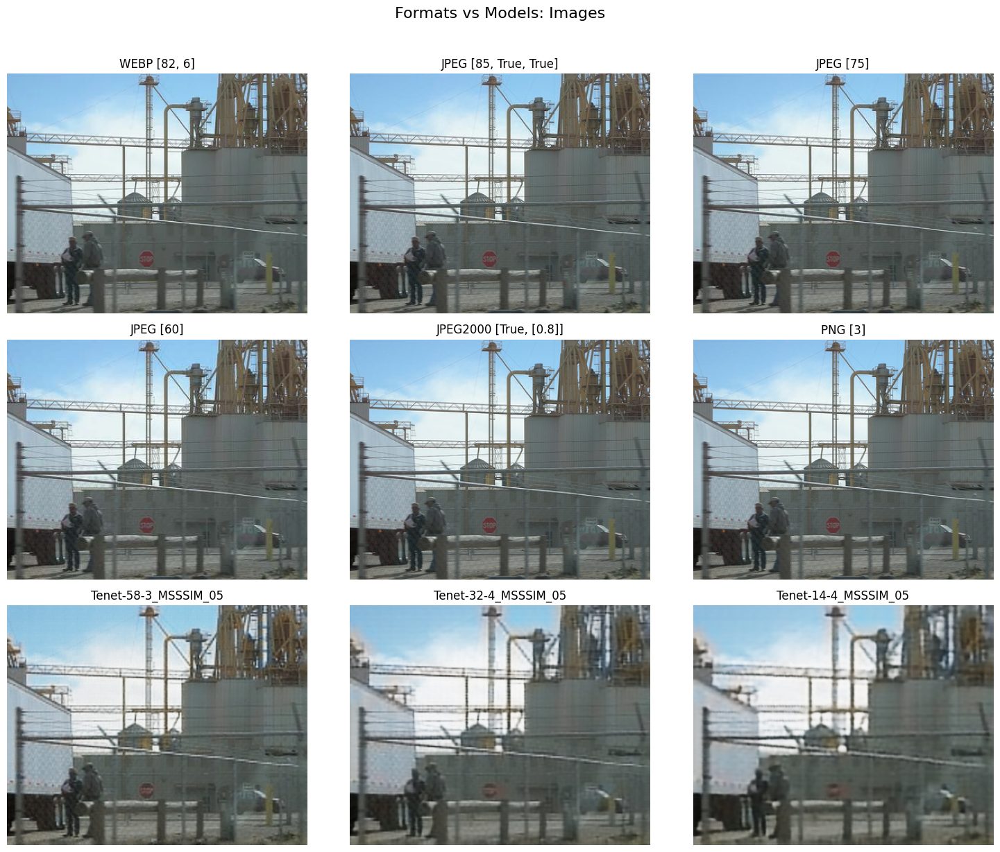

In [89]:
formats_vs_models(images[7], positions=[1, 4, 5, 7, 8, 11, 15, 16, 17], layout=(3, 3), figsize=(15, 12))

Actually, `Tenet-58-3` is not really bad. It is almost as goog as `JPEG2000` and almost 2 times less big.

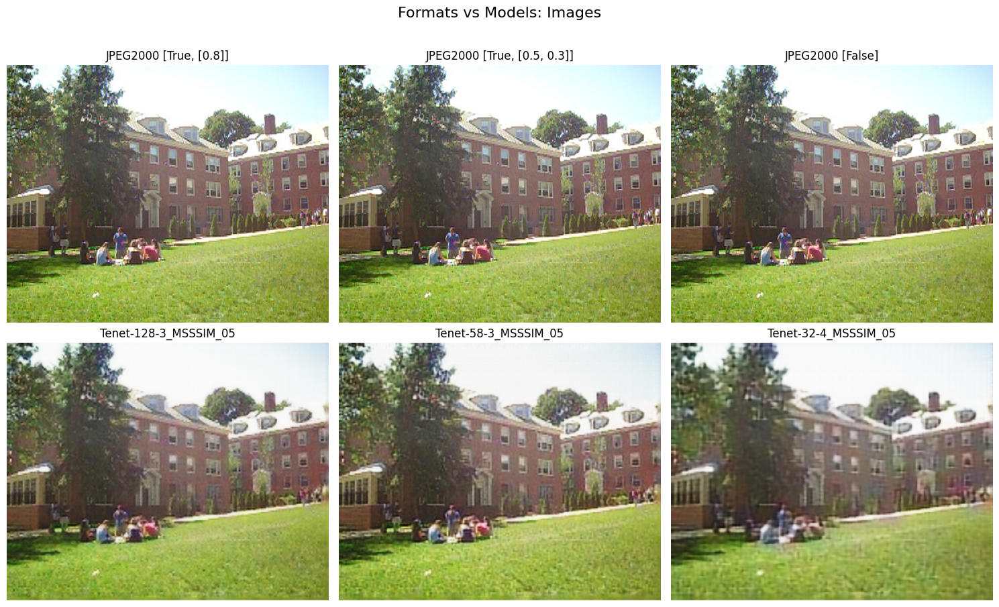

In [101]:
formats_vs_models(images[9], positions=[8, 9, 10, 14, 15, 16], layout=(2, 3), figsize=(15, 9))

## 4. Conclusion

The models we mode showed themselves as a pretty good compressors. The compression times are smaller than the durations of conversions via lossless `WebP` and approximately like the time of `JPEG2000`. The size of files produced by them is less than the size of every lossless format and whole family of `JPEG2000`.

But unfortunately, none of metrics shows positive result in relation to `Tenet` model.

The huge experiment has ended. It was long and hard, but interesting and instructive. I have tested dozens of strategies, trained tens of model, plotted about a hundred of graphs.

Even though the results are not better than baseline, I honestly love this project.